##### Copyright 2023 The MediaPipe Authors. All Rights Reserved.

In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Hand Landmarks Detection with MediaPipe Tasks

This notebook shows you how to use MediaPipe Tasks Python API to detect hand landmarks from images.

## Preparation

Let's start with installing MediaPipe.

In [6]:
!pip install -q mediapipe

Then download an off-the-shelf model bundle. Check out the [MediaPipe documentation](https://developers.google.com/mediapipe/solutions/vision/hand_landmarker#models) for more information about this model bundle.

In [7]:
!wget -q https://storage.googleapis.com/mediapipe-models/hand_landmarker/hand_landmarker/float16/1/hand_landmarker.task

## Visualization utilities

In [8]:
#@markdown We implemented some functions to visualize the hand landmark detection results. <br/> Run the following cell to activate the functions.

from mediapipe import solutions
from mediapipe.framework.formats import landmark_pb2
import numpy as np

MARGIN = 10  # pixels
FONT_SIZE = 1
FONT_THICKNESS = 1
HANDEDNESS_TEXT_COLOR = (88, 205, 54) # vibrant green

def draw_landmarks_on_image(rgb_image, detection_result):
  hand_landmarks_list = detection_result.hand_landmarks
  handedness_list = detection_result.handedness
  annotated_image = np.copy(rgb_image)

  # Loop through the detected hands to visualize.
  for idx in range(len(hand_landmarks_list)):
    hand_landmarks = hand_landmarks_list[idx]
    handedness = handedness_list[idx]

    # Draw the hand landmarks.
    hand_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
    hand_landmarks_proto.landmark.extend([
      landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) for landmark in hand_landmarks
    ])
    solutions.drawing_utils.draw_landmarks(
      annotated_image,
      hand_landmarks_proto,
      solutions.hands.HAND_CONNECTIONS,
      solutions.drawing_styles.get_default_hand_landmarks_style(),
      solutions.drawing_styles.get_default_hand_connections_style())

    # Get the top left corner of the detected hand's bounding box.
    height, width, _ = annotated_image.shape
    x_coordinates = [landmark.x for landmark in hand_landmarks]
    y_coordinates = [landmark.y for landmark in hand_landmarks]
    text_x = int(min(x_coordinates) * width)
    text_y = int(min(y_coordinates) * height) - MARGIN

    # Draw handedness (left or right hand) on the image.
    cv2.putText(annotated_image, f"{handedness[0].category_name}",
                (text_x, text_y), cv2.FONT_HERSHEY_DUPLEX,
                FONT_SIZE, HANDEDNESS_TEXT_COLOR, FONT_THICKNESS, cv2.LINE_AA)

  return annotated_image

## Download test image

Let's grab a test image that we'll use later. The image is from [Unsplash](https://unsplash.com/photos/mt2fyrdXxzk).

In [ ]:
!wget -q -O image.jpg https://storage.googleapis.com/mediapipe-tasks/hand_landmarker/woman_hands.jpg

import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread("image.jpg")
cv2_imshow(img)

Optionally, you can upload your own image. If you want to do so, uncomment and run the cell below.

In [9]:
from google.colab import files
uploaded = files.upload()

for filename in uploaded:
   content = uploaded[filename]
   with open(filename, 'wb') as f:
     f.write(content)

if len(uploaded.keys()):
   IMAGE_FILE = next(iter(uploaded))
   print('Uploaded file:', IMAGE_FILE)

Saving WIN_20241026_10_38_37_Pro.jpg to WIN_20241026_10_38_37_Pro.jpg
Saving WIN_20241026_10_38_38_Pro.jpg to WIN_20241026_10_38_38_Pro.jpg
Saving WIN_20241026_10_38_39_Pro.jpg to WIN_20241026_10_38_39_Pro.jpg
Saving WIN_20241026_10_38_42_Pro.jpg to WIN_20241026_10_38_42_Pro.jpg
Saving WIN_20241026_10_38_44_Pro.jpg to WIN_20241026_10_38_44_Pro.jpg
Uploaded file: WIN_20241026_10_38_37_Pro.jpg


## Running inference and visualizing the results

Here are the steps to run hand landmark detection using MediaPipe.

Check out the [MediaPipe documentation](https://developers.google.com/mediapipe/solutions/vision/hand_landmarker/python) to learn more about configuration options that this solution supports.


Image 1:


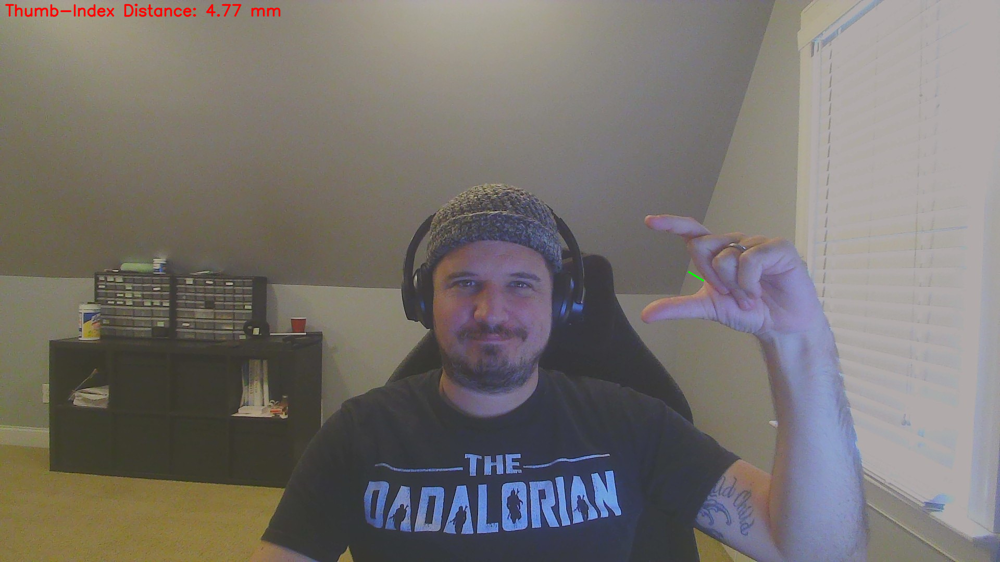

Image 2:


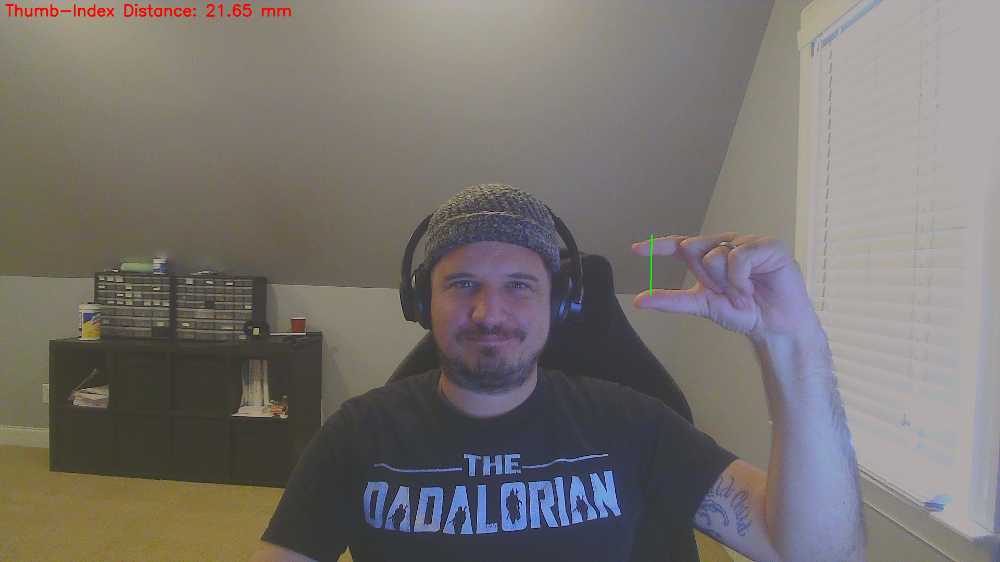

Image 3:


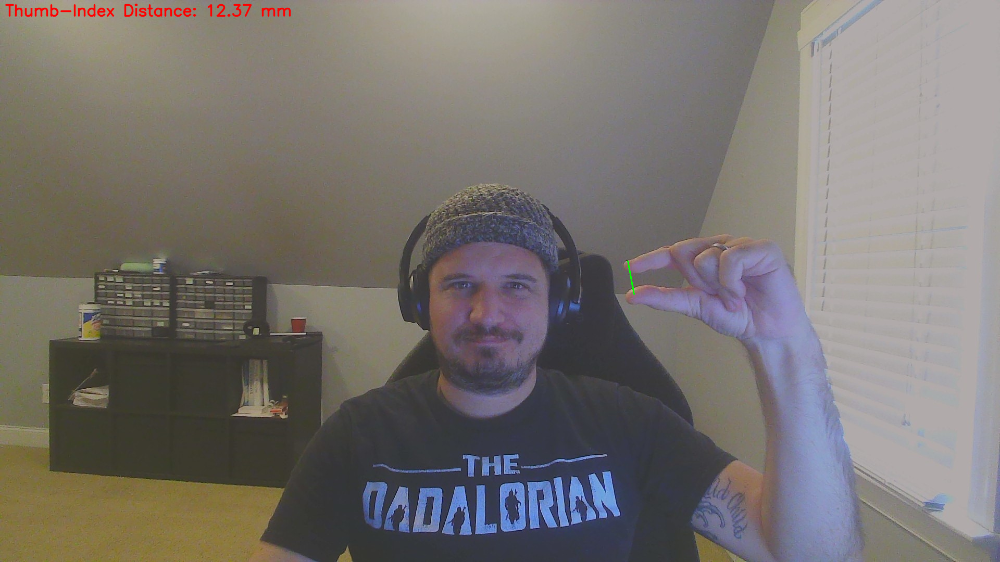

Image 4:


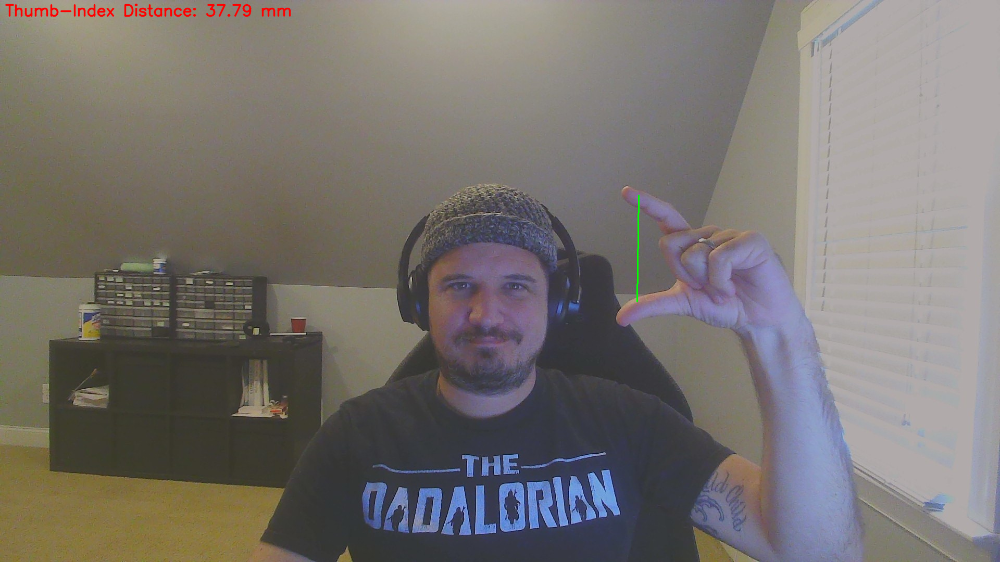

Image 5:


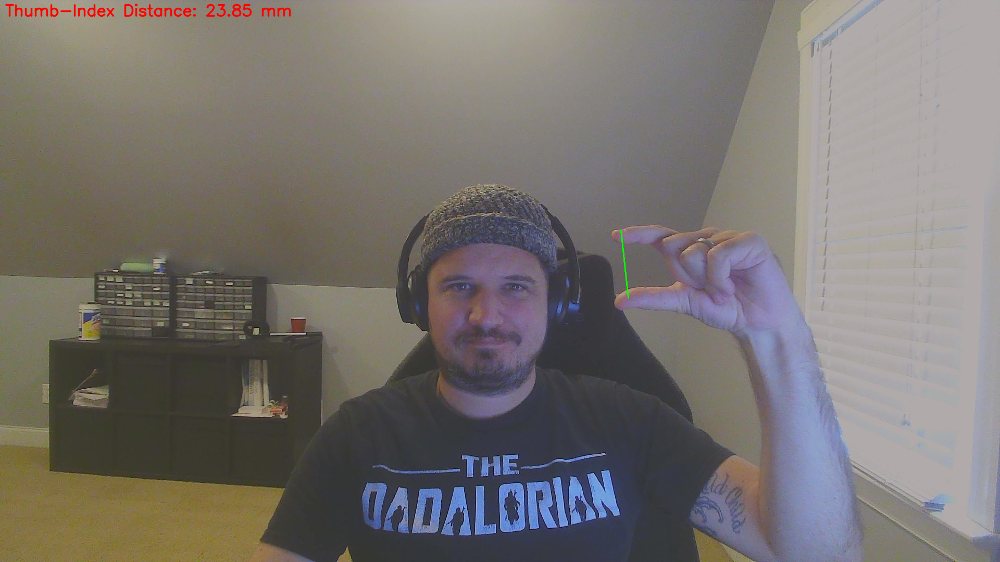

In [19]:
# STEP 1: Import the necessary modules.
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
import cv2  # For displaying images
import numpy as np

# STEP 2: Create a HandLandmarker object.
base_options = python.BaseOptions(model_asset_path='hand_landmarker.task')
options = vision.HandLandmarkerOptions(base_options=base_options, num_hands=2)
detector = vision.HandLandmarker.create_from_options(options)

# Scaling factor to convert normalized distance to mm (doubled based on user request)
scaling_factor_mm = 200  # Adjusted based on request; placeholder for real reference

# Helper function to calculate the distance between the thumb and index finger tips
def calculate_thumb_index_distance(landmarks):
    # Check if we have enough landmarks
    if len(landmarks) < 9:
        return None  # Not enough landmarks to calculate distance

    # Thumb tip and index finger tip landmarks
    thumb_tip = landmarks[4]
    index_tip = landmarks[8]

    # Calculate the Euclidean distance between the thumb tip and index finger tip
    distance = ((thumb_tip.x - index_tip.x) ** 2 +
                (thumb_tip.y - index_tip.y) ** 2 +
                (thumb_tip.z - index_tip.z) ** 2) ** 0.5
    return distance * scaling_factor_mm  # Convert to mm with doubled scaling factor

# List of image file names (replace with actual paths to five images)
IMAGE_FILENAMES = ["WIN_20241026_10_38_37_Pro.jpg", "WIN_20241026_10_38_38_Pro.jpg", "WIN_20241026_10_38_39_Pro.jpg", "WIN_20241026_10_38_42_Pro.jpg", "WIN_20241026_10_38_44_Pro.jpg"]

# Process each image in the list
for i, image_file_name in enumerate(IMAGE_FILENAMES):
    # STEP 3: Load the input image.
    image = mp.Image.create_from_file(image_file_name)

    # STEP 4: Detect hand landmarks from the input image.
    detection_result = detector.detect(image)

    # STEP 5: Calculate the distance if landmarks are available
    if detection_result.hand_landmarks and len(detection_result.hand_landmarks) > 0:
        hand_landmarks = detection_result.hand_landmarks[0]  # Using the first detected hand
        distance = calculate_thumb_index_distance(hand_landmarks)

        # STEP 6: Annotate the distance and draw a line if available
        annotated_image = image.numpy_view().copy()
        if distance is not None:
            # Draw the distance as text on the image
            cv2.putText(annotated_image, f"Thumb-Index Distance: {distance:.2f} mm",
                        (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)

            # Get the coordinates for thumb tip and index tip (scaled to image dimensions)
            thumb_tip_coords = (int(hand_landmarks[4].x * annotated_image.shape[1]),
                                int(hand_landmarks[4].y * annotated_image.shape[0]))
            index_tip_coords = (int(hand_landmarks[8].x * annotated_image.shape[1]),
                                int(hand_landmarks[8].y * annotated_image.shape[0]))

            # Draw a line between thumb tip and index tip
            cv2.line(annotated_image, thumb_tip_coords, index_tip_coords, (0, 255, 0), 2)

        # Display the annotated image
        print(f"Image {i + 1}:")
        cv2_imshow(cv2.cvtColor(annotated_image, cv2.COLOR_RGB2BGR))
    else:
        print(f"Image {i + 1}: No hand landmarks detected.")
